<a href="https://colab.research.google.com/github/dayutirta/Machine-Learning-TI-3E-2024/blob/main/PCVK_Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Biodata
Nama     : Muhammad Dayutirta Mahara <br>
NIM      : 2241720210 <br>
Kelas/No : TI 3E/20


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from __future__ import print_function
import numpy as np
import argparse
import cv2 as cv
from google.colab.patches import cv2_imshow

In [ ]:
# Gambar yang digunakan
imgFemale = cv.imread('/content/drive/MyDrive/PCVK/baru/female.tiff')
imgCouple = cv.imread('/content/drive/MyDrive/PCVK/baru/couple.tiff')
imgGalaxy = cv.imread('/content/drive/MyDrive/PCVK/baru/galaxy.jpg')

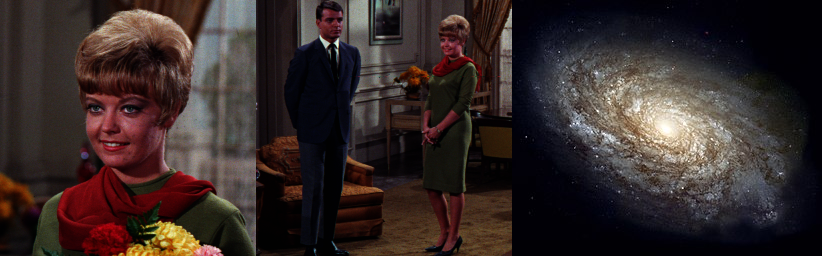

In [ ]:
cv2_imshow(cv.hconcat([imgFemale, imgCouple, imgGalaxy]))

## Praktikum No 1
1. Buat Gamma Correction

In [ ]:
imgNo1 = imgFemale.copy()

In [ ]:
def adjust_gamma(image, gamma=1.0):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	# apply gamma correction using the lookup table
	return cv.LUT(image, table)

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


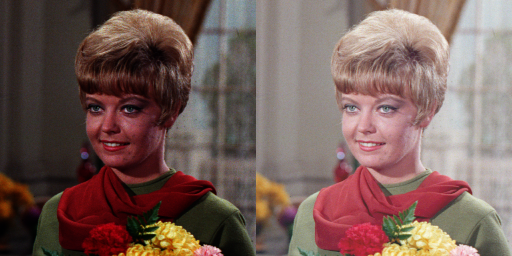

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
 gammaInput = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')

adjusted = adjust_gamma(imgNo1, gamma=gammaInput)
cv2_imshow(np.hstack([imgNo1, adjusted]))

## Praktikum No 2
2. Simulasi Depth Image

In [ ]:
imgNo2 = imgFemale.copy()

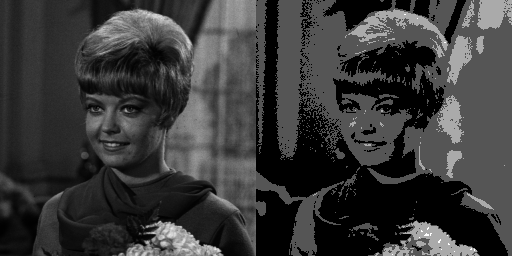

In [ ]:
bit_depth = 2
level = (255/(2**(bit_depth)-1))
original = imgNo2.copy()
original = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
depth_image = np.zeros(original.shape,original.dtype)

for i in range(original.shape[0]):
  for j in range(original.shape[1]):
    depth_image[i,j] = round((original[i,j]/level))*level

final_frame = cv.hconcat((original,depth_image))
cv2_imshow(final_frame)

## Praktikum No 3
 3. Modul Average Denoising

In [ ]:
import glob
imgNo3 =[]
for img in glob.glob('/content/drive/MyDrive/PCVK/noises/*.jpg'):
  n = cv.imread(img)
  imgNo3.append(n)

In [ ]:
def PNSR(img1,img2):
  mse = np.mean((img1-img2)**2)
  if mse == 0:
    return 100
  max_pixel = 255.0
  psnr = 20*np.log10(max_pixel/np.sqrt(mse))
  return psnr

def averageDenoising(index):
  denoised_image = np.zeros_like(imgNo3[0], dtype=np.float32)
  for i in range(index):
    denoised_image += imgNo3[i].astype(np.float32)

  return denoised_image

29.111317631956396


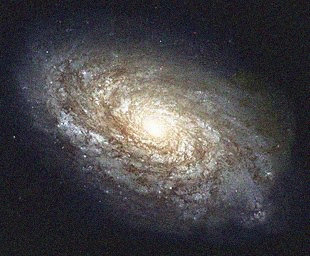

In [ ]:
denoised_image_5 = averageDenoising(5)
denoised_image_5 /= 5
denoised_image_5 = np.uint8(denoised_image_5)
print(PNSR(imgNo3[0],denoised_image_5))
cv2_imshow(denoised_image_5)

29.01150311708355


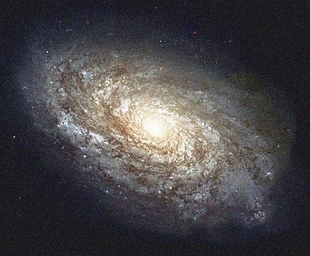

In [ ]:
denoised_image_10 = averageDenoising(10)
denoised_image_10 /= 10
denoised_image_10 = np.uint8(denoised_image_10)
print(PNSR(imgNo3[0],denoised_image_10))
cv2_imshow(denoised_image_10)

28.94754955146597


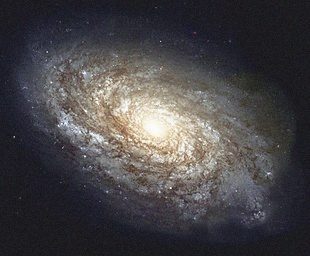

In [ ]:
denoised_image_20 = averageDenoising(20)
denoised_image_20 /= 20
denoised_image_20 = np.uint8(denoised_image_20)
print(PNSR(imgNo3[0],denoised_image_20))
cv2_imshow(denoised_image_20)

28.926875293666914


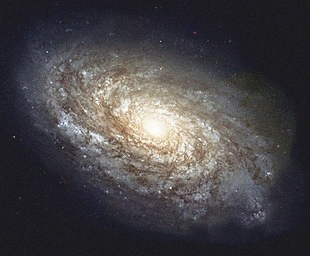

In [ ]:
denoised_image_40 = averageDenoising(40)
denoised_image_40 /= 40
denoised_image_40 = np.uint8(denoised_image_40)
print(PNSR(imgNo3[0],denoised_image_40))
cv2_imshow(denoised_image_40)

28.919385017174555


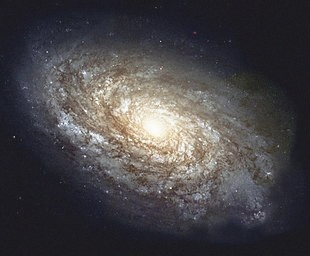

In [ ]:
denoised_image_80 = averageDenoising(80)
denoised_image_80 /= 80
denoised_image_80 = np.uint8(denoised_image_80)
print(PNSR(imgNo3[0],denoised_image_80))
cv2_imshow(denoised_image_80)

28.91734513032903


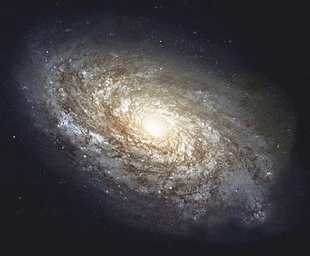

In [ ]:
denoised_image_100 = averageDenoising(100)
denoised_image_100 /= 100
denoised_image_100 = np.uint8(denoised_image_100)
print(PNSR(imgNo3[0],denoised_image_100))
cv2_imshow(denoised_image_100)

## Praktikum No 4
4. Image Masking

In [18]:
# Gambar yang digunakan
ktmku = cv.imread('/content/ktmku.jpeg')
bima = cv.imread('/content/bima.jpeg')
azka = cv.imread('/content/azka.jpeg')

ktmku = cv.cvtColor(ktmku, cv.COLOR_BGR2RGB)

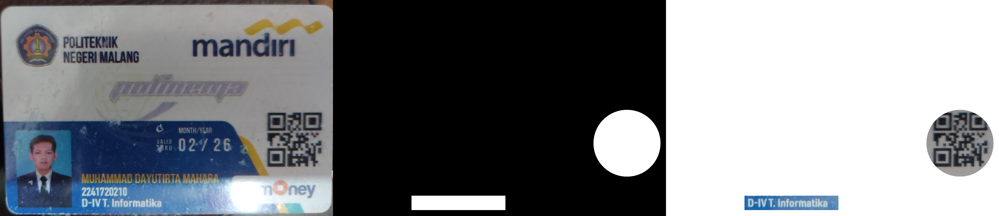

In [19]:
mask = np.zeros(ktmku.shape, dtype=np.uint8)
mask = cv.circle(mask, (3070,1500), 350, (255,255,255), -1)
mask = cv.rectangle(mask, (820, 2200), (1800, 2050), (255, 255, 255), -1)

# Mask input ktmku with binary mask
result = cv.bitwise_and(ktmku, mask)
# Color background white
result[mask==0] = 255

ktmku = cv.cvtColor(ktmku, cv.COLOR_BGR2RGB)
result = cv.cvtColor(result, cv.COLOR_BGR2RGB)
cv2_imshow(cv.hconcat([ktmku, mask, result]))

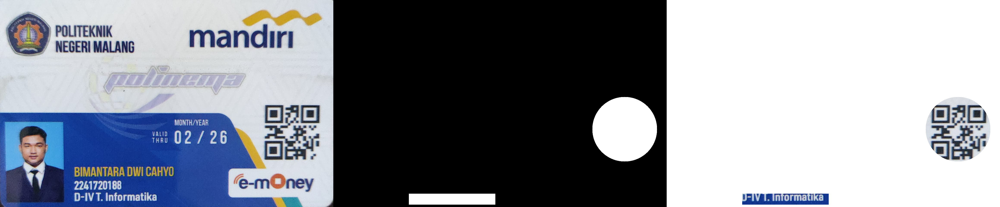

In [20]:
mask = np.zeros(bima.shape, dtype=np.uint8)
mask = cv.circle(mask, (1350, 600), 150, (255, 255, 255), -1)
mask = cv.rectangle(mask, (750, 950), (350, 900), (255, 255, 255), -1)

result = cv.bitwise_and(bima, mask)
result[mask == 0] = 255
cv2_imshow(cv.hconcat([bima, mask, result]))


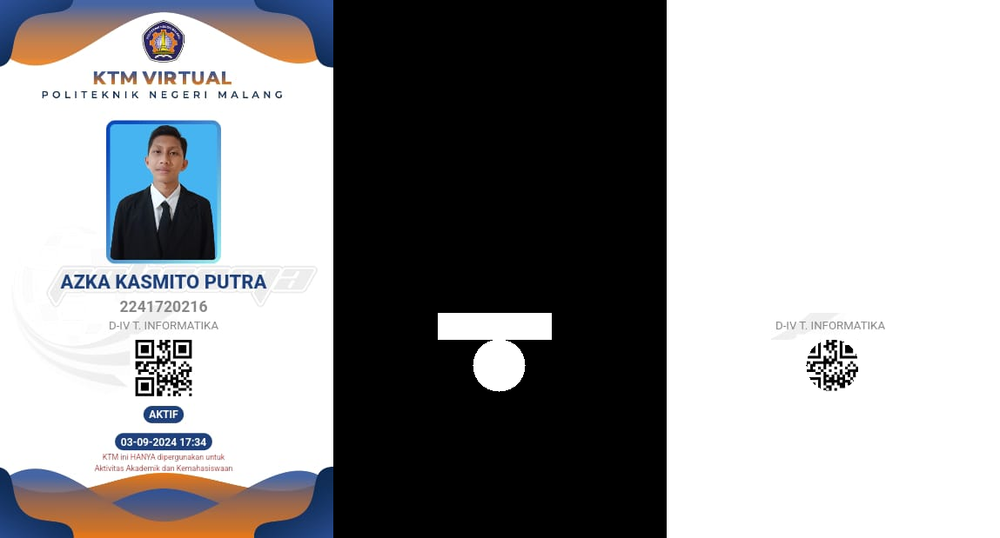

In [21]:
mask = np.zeros(azka.shape, dtype=np.uint8)
mask = cv.circle(mask, (190, 420), 30, (255, 255, 255), -1)
mask = cv.rectangle(mask, (250, 390), (120, 360), (255, 255, 255), -1)

result = cv.bitwise_and(azka, mask)
result[mask == 0] = 255

cv2_imshow(cv.hconcat([azka, mask, result]))
